# Multi-Disease, Multi-View & Multi-Center Right Ventricular Segmentation in Cardiac MRI
__Main Goal__

+ Segmentation of the Right Ventricular in cardiac MRI
+ Source: https://competitions.codalab.org/competitions/31559
+ This notebook is a Proof of Concept to explore the data and to train a model with all data available.
+ In this notebook, the segmentation task is done for all the MRI in the LA_ED, not only the Right Ventricular
+ As the data are medical 3D studies, we are going to use the Faimed3d library, based on fastai

__Description__

+ The Right Ventricular must be segmented in four perspectives:
        + LA_ED: Long Axis End Diastole --> One frame per file
        + LA_ES: Long Axis End Systole --> One frame per file
        + SA_ED: Short Axis End Diastole --> Between 6 and 16 frames per file
        + SA_ES: Short Axis End Systole --> Between 6 and 16 frames per file
+ A segmented mask should be given for each perspective and for each pacient

In [ ]:
! pip install simpleitk
! pip install pylibjpeg pylibjpeg-libjpeg pylibjpeg-openjpeg

In [ ]:
!pip install dicom
!pip install nibabel

In [ ]:
#Uncommented next line to install faimed3d
#! pip install --trusted-host pypi.org --trusted-host files.pythonhosted.org -Uqq git+https://github.com/kbressem/faimed3d.git

In [11]:
#Loading medical libraries
from faimed3d.faimed3d.all import *
import pylibjpeg
from skimage import io, color
import nibabel as nib

In [4]:
#Loading main libraries
import numpy as np
import matplotlib.pyplot as plt
import time
import pandas as pd
from torch import nn
from pathlib import Path
from PIL import Image
from datetime import datetime
import math

In [5]:
#Loading fastai modules
from fastai.vision.all import *
from fastai.vision.widgets import *
from fastai.callback.fp16 import *
from fastai.vision import *
import fastai
import torch
from fastai.callback.all import SaveModelCallback
from sklearn.metrics import confusion_matrix, classification_report, recall_score, roc_auc_score, cohen_kappa_score,f1_score

In [6]:
print("Fastai version: ",fastai.__version__)

Fastai version:  2.2.5


In [7]:
print("GPU available: ",torch.cuda.get_device_name(0))

GPU available:  GeForce GTX 1080 Ti


In [12]:
#Let's choose one GPU
torch.cuda.set_device(1)

In [13]:
#Showing and saving the graphs within this notebook
%matplotlib inline
#Reload automatically the modules after executing each cell
%reload_ext autoreload
%autoreload 2

In [14]:
#This is for ssl issues
import os, ssl
if (not os.environ.get('PYTHONHTTPSVERIFY', '') and getattr(ssl, '_create_unverified_context', None)):
    ssl._create_default_https_context = ssl._create_unverified_context

In [15]:
#Path to your csv and images folders
path = Path('/host_dir/home/adrian/extras/RV/MnM-2')

# Building the CSV with the data available

In [16]:
train_list = ['training/' + s + '/'+s+'_LA_ED.nii.gz'+',training/' + s + '/'+s+'_LA_ED_gt.nii.gz'+','+'training/' + s + '/'+s+'_LA_ES.nii.gz'+',training/' + s + '/'+s+'_LA_ES_gt.nii.gz'+',training/' + s + '/'+s+'_SA_ED.nii.gz'+',training/' + s + '/'+s+'_SA_ED_gt.nii.gz'+',training/' + s + '/'+s+'_SA_ES.nii.gz'+',training/' + s + '/'+s+'_SA_ES_gt.nii.gz'+',train,0' for s in os.listdir(path/'training')]
test_list = ['test/' + s + '/'+s+'_LA_ED.nii.gz'+','+'-'+',test/' + s + '/'+s+'_LA_ES.nii.gz,'+'-'+',test/' + s + '/'+s+'_SA_ED.nii.gz,'+'-'+',test/' + s + '/'+s+'_SA_ES.nii.gz,'+'-'+',test,0' for s in os.listdir(path/'validation')]

In [18]:
all_studies = train_list + test_list

In [19]:
df = pd.DataFrame([sub.split(",") for sub in all_studies], columns = ['LA_ED','LA_ED_gt','LA_ES','LA_ES_gt','SA_ED','SA_ED_gt','SA_ES','SA_ES_gt','set','label'])

+ Split the data in `train`, `val` and `test` just looking to the indexes as we do not have more information about the patients
+ We are provided with 160 patients for training and 40 patients for validation. We call the validation folder provided as `test` and we split the training folder in `train` and `val` because we must return the masks for the validation folder (now called `test`)
+ From index (**NOT PATIENT**) 0 to 120 is `train`, from 121 to 159 is `val` and from 160 to 199 is `test`. The split is 60/20/20 summing all studies or 75/25 regarding the original training folder

In [20]:
df.loc[(df.index > 120) & (df.index < 160), 'set'] = 'val' 
df

,LA_ED,LA_ED_gt,LA_ES,LA_ES_gt,SA_ED,SA_ED_gt,SA_ES,SA_ES_gt,set,label
0,training/150/150_LA_ED.nii.gz,training/150/150_LA_ED_gt.nii.gz,training/150/150_LA_ES.nii.gz,training/150/150_LA_ES_gt.nii.gz,training/150/150_SA_ED.nii.gz,training/150/150_SA_ED_gt.nii.gz,training/150/150_SA_ES.nii.gz,training/150/150_SA_ES_gt.nii.gz,train,0
1,training/030/030_LA_ED.nii.gz,training/030/030_LA_ED_gt.nii.gz,training/030/030_LA_ES.nii.gz,training/030/030_LA_ES_gt.nii.gz,training/030/030_SA_ED.nii.gz,training/030/030_SA_ED_gt.nii.gz,training/030/030_SA_ES.nii.gz,training/030/030_SA_ES_gt.nii.gz,train,0
2,training/019/019_LA_ED.nii.gz,training/019/019_LA_ED_gt.nii.gz,training/019/019_LA_ES.nii.gz,training/019/019_LA_ES_gt.nii.gz,training/019/019_SA_ED.nii.gz,training/019/019_SA_ED_gt.nii.gz,training/019/019_SA_ES.nii.gz,training/019/019_SA_ES_gt.nii.gz,train,0
3,training/051/051_LA_ED.nii.gz,training/051/051_LA_ED_gt.nii.gz,training/051/051_LA_ES.nii.gz,training/051/051_LA_ES_gt.nii.gz,training/051/051_SA_ED.nii.gz,training/051/051_SA_ED_gt.nii.gz,training/051/051_SA_ES.nii.gz,training/051/051_SA_ES_gt.nii.gz,train,0
4,training/099/099_LA_ED.nii.gz,training/099/099_LA_ED_gt.nii.gz,training/099/099_LA_ES.nii.gz,training/099/099_LA_ES_gt.nii.gz,training/099/099_SA_ED.nii.gz,training/099/099_SA_ED_gt.nii.gz,training/099/099_SA_ES.nii.gz,training/099/099_SA_ES_gt.nii.gz,train,0
...,...,...,...,...,...,...,...,...,...,...
195,test/187/187_LA_ED.nii.gz,-,test/187/187_LA_ES.nii.gz,-,test/187/187_SA_ED.nii.gz,-,test/187/187_SA_ES.nii.gz,-,test,0
196,test/176/176_LA_ED.nii.gz,-,test/176/176_LA_ES.nii.gz,-,test/176/176_SA_ED.nii.gz,-,test/176/176_SA_ES.nii.gz,-,test,0
197,test/196/196_LA_ED.nii.gz,-,test/196/196_LA_ES.nii.gz,-,test/196/196_SA_ED.nii.gz,-,test/196/196_SA_ES.nii.gz,-,test,0
198,test/193/193_LA_ED.nii.gz,-,test/193/193_LA_ES.nii.gz,-,test/193/193_SA_ED.nii.gz,-,test/193/193_SA_ES.nii.gz,-,test,0


<AxesSubplot:>

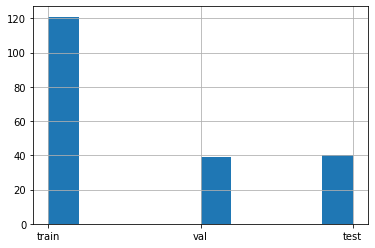

In [21]:
df.set.hist()

In [22]:
df.to_csv('dataset_RV' + '.csv', index=False)

# Reading our CSV

In [23]:
df = pd.read_csv('./dataset_RV.csv')

In [24]:
df2=df[df.set!='test']

In [25]:
# Let's convert the set column to a boolean type for the dataloader
df2.loc[df2.set == 'val',['set']]  = True
df2.loc[df2.set == 'train',['set']]  = False
df2

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


,LA_ED,LA_ED_gt,LA_ES,LA_ES_gt,SA_ED,SA_ED_gt,SA_ES,SA_ES_gt,set,label
0,training/150/150_LA_ED.nii.gz,training/150/150_LA_ED_gt.nii.gz,training/150/150_LA_ES.nii.gz,training/150/150_LA_ES_gt.nii.gz,training/150/150_SA_ED.nii.gz,training/150/150_SA_ED_gt.nii.gz,training/150/150_SA_ES.nii.gz,training/150/150_SA_ES_gt.nii.gz,False,0
1,training/030/030_LA_ED.nii.gz,training/030/030_LA_ED_gt.nii.gz,training/030/030_LA_ES.nii.gz,training/030/030_LA_ES_gt.nii.gz,training/030/030_SA_ED.nii.gz,training/030/030_SA_ED_gt.nii.gz,training/030/030_SA_ES.nii.gz,training/030/030_SA_ES_gt.nii.gz,False,0
2,training/019/019_LA_ED.nii.gz,training/019/019_LA_ED_gt.nii.gz,training/019/019_LA_ES.nii.gz,training/019/019_LA_ES_gt.nii.gz,training/019/019_SA_ED.nii.gz,training/019/019_SA_ED_gt.nii.gz,training/019/019_SA_ES.nii.gz,training/019/019_SA_ES_gt.nii.gz,False,0
3,training/051/051_LA_ED.nii.gz,training/051/051_LA_ED_gt.nii.gz,training/051/051_LA_ES.nii.gz,training/051/051_LA_ES_gt.nii.gz,training/051/051_SA_ED.nii.gz,training/051/051_SA_ED_gt.nii.gz,training/051/051_SA_ES.nii.gz,training/051/051_SA_ES_gt.nii.gz,False,0
4,training/099/099_LA_ED.nii.gz,training/099/099_LA_ED_gt.nii.gz,training/099/099_LA_ES.nii.gz,training/099/099_LA_ES_gt.nii.gz,training/099/099_SA_ED.nii.gz,training/099/099_SA_ED_gt.nii.gz,training/099/099_SA_ES.nii.gz,training/099/099_SA_ES_gt.nii.gz,False,0
...,...,...,...,...,...,...,...,...,...,...
155,training/100/100_LA_ED.nii.gz,training/100/100_LA_ED_gt.nii.gz,training/100/100_LA_ES.nii.gz,training/100/100_LA_ES_gt.nii.gz,training/100/100_SA_ED.nii.gz,training/100/100_SA_ED_gt.nii.gz,training/100/100_SA_ES.nii.gz,training/100/100_SA_ES_gt.nii.gz,True,0
156,training/074/074_LA_ED.nii.gz,training/074/074_LA_ED_gt.nii.gz,training/074/074_LA_ES.nii.gz,training/074/074_LA_ES_gt.nii.gz,training/074/074_SA_ED.nii.gz,training/074/074_SA_ED_gt.nii.gz,training/074/074_SA_ES.nii.gz,training/074/074_SA_ES_gt.nii.gz,True,0
157,training/044/044_LA_ED.nii.gz,training/044/044_LA_ED_gt.nii.gz,training/044/044_LA_ES.nii.gz,training/044/044_LA_ES_gt.nii.gz,training/044/044_SA_ED.nii.gz,training/044/044_SA_ED_gt.nii.gz,training/044/044_SA_ES.nii.gz,training/044/044_SA_ES_gt.nii.gz,True,0
158,training/073/073_LA_ED.nii.gz,training/073/073_LA_ED_gt.nii.gz,training/073/073_LA_ES.nii.gz,training/073/073_LA_ES_gt.nii.gz,training/073/073_SA_ED.nii.gz,training/073/073_SA_ED_gt.nii.gz,training/073/073_SA_ES.nii.gz,training/073/073_SA_ES_gt.nii.gz,True,0


# Dataloader

`ResizeCrop3D(300px)`,`resnet34_3D`,`fine_tune`,`50 epochs`, `only 45º degree rotate` augmentations, batch_size=16, metrics=`Dice_Multi`, loss=`dice_ce_loss`,`weight_decay`=0.0001

In [26]:
# We mix the DiceLoss and the CrossEntropyLoss to approach the loss function to our metric (DiceMulti)
def dice_ce_loss(input, target, reduction=None):
    alpha=0
    return ((1-alpha) * float(DiceLoss(method='miletari',avg='macro')(input, target)) + nn.CrossEntropyLoss()(input, target[:, 0]))

In [28]:
#from_df() method takes, by default, the first column as the independent variable (the 'x') and the second column as dependent variable (the 'y')
dls = SegmentationDataLoaders3D.from_df(df2,path=path,
                                 valid_col = 'set',
                                 item_tfms = ResizeCrop3D((0, 0, 0), (1, 300, 300)), 
                                batch_tfms = [RandomRotate3DBy(degrees=(0, 0, 45)),
                                     *aug_transforms_3d(p_all = .0,
                                                  warp = False, p_warp = None,
                                                  sheer = False, p_sheer = None,
                                                  trapezoid = False, p_trapezoid = None,
                                                  dihedral = False, p_dihedral = None,
                                                  brightness = False, p_brightness = None,
                                                  contrast = False, p_contrast = None,
                                                  noise = False, p_noise = None,
                                                  rotate_by = False, p_rotate_by = None,
                                                  flip = False, p_flip = None,
                                                  rotate = False, p_rotate = None,
                                                  blur = False, p_blur = None,
                                                  crop = False, p_crop = 1)
                                        ],
                                 bs = 16, val_bs = 16)

/workspace/host_dir/home/adrian/extras/RV/faimed3d/faimed3d/basics.py:264: UserWarning: Object is not a rank 3 tensor but a rank 4 tensor. Removing the first dimension
  warn('Object is not a rank 3 tensor but a rank {} tensor. Removing the first dimension'.format(t.ndim))


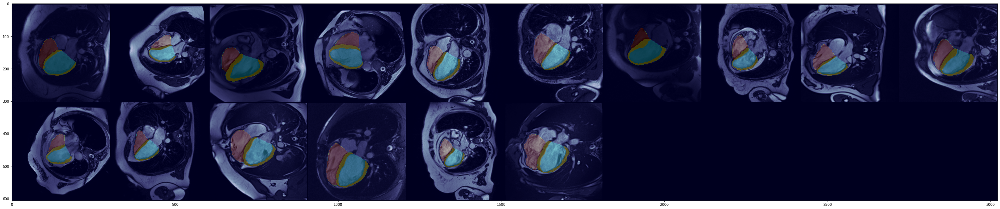

In [29]:
xb1, yb1 = dls.train.one_batch()
xb1.show(figsize = (50, 50))
yb1.show(add_to_existing=True, alpha=0.25, cmap='jet')

# Training

In [17]:
learn = unet_learner_3d(dls, resnet34_3d, n_out=4, 
                        loss_func = dice_ce_loss,
                        metrics = [DiceMulti],
                        model_dir = './models',
                        cbs = [SaveModelCallback(monitor='dice_multi')]
                       )
learn.to_fp16()

## First try

SuggestedLRs(lr_min=0.04365158379077912, lr_steep=0.3630780577659607)

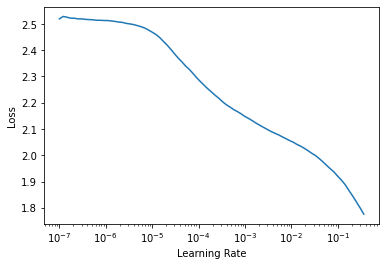

In [20]:
learn.lr_find()

In [20]:
learn.fine_tune(50, freeze_epochs = 1, wd = 1e-4, base_lr=0.003)

epoch,train_loss,valid_loss,dice_multi,time
0,2.237194,nan,0.117866,00:30


Better model found at epoch 0 with dice_multi value: 0.11786632226729882.


epoch,train_loss,valid_loss,dice_multi,time
0,1.926177,34.865826,0.165821,00:19
1,1.898473,5.073708,0.311816,00:19
2,1.881867,2.792941,0.329270,00:18
3,1.870800,2.364777,0.363211,00:19
4,1.862099,2.232714,0.377126,00:18
5,1.854668,2.390456,0.405354,00:18
6,1.847499,2.275842,0.426768,00:18
7,1.839647,1.871979,0.444636,00:19
8,1.832686,1.816437,0.454155,00:19
9,1.826196,1.891906,0.429239,00:18


Better model found at epoch 0 with dice_multi value: 0.16582050842934695.
Better model found at epoch 1 with dice_multi value: 0.3118161492688084.
Better model found at epoch 2 with dice_multi value: 0.3292698563222914.
Better model found at epoch 3 with dice_multi value: 0.36321102879209316.
Better model found at epoch 4 with dice_multi value: 0.3771257724642468.
Better model found at epoch 5 with dice_multi value: 0.4053538956719625.
Better model found at epoch 6 with dice_multi value: 0.4267682226109315.
Better model found at epoch 7 with dice_multi value: 0.4446355729910122.
Better model found at epoch 8 with dice_multi value: 0.4541553564577884.
Better model found at epoch 15 with dice_multi value: 0.45807184763691966.
Better model found at epoch 20 with dice_multi value: 0.47272538775295386.
Better model found at epoch 21 with dice_multi value: 0.4770128256174776.
Better model found at epoch 22 with dice_multi value: 0.5053542738727861.
Better model found at epoch 23 with dice_mu

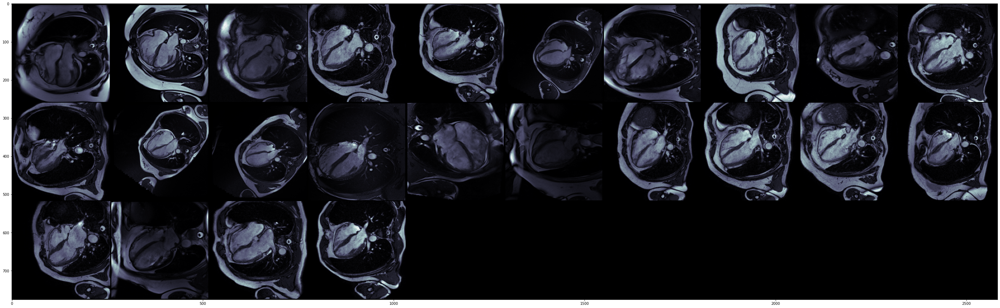

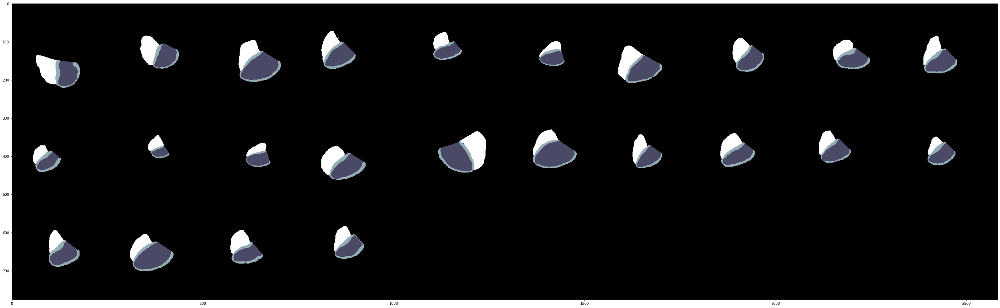

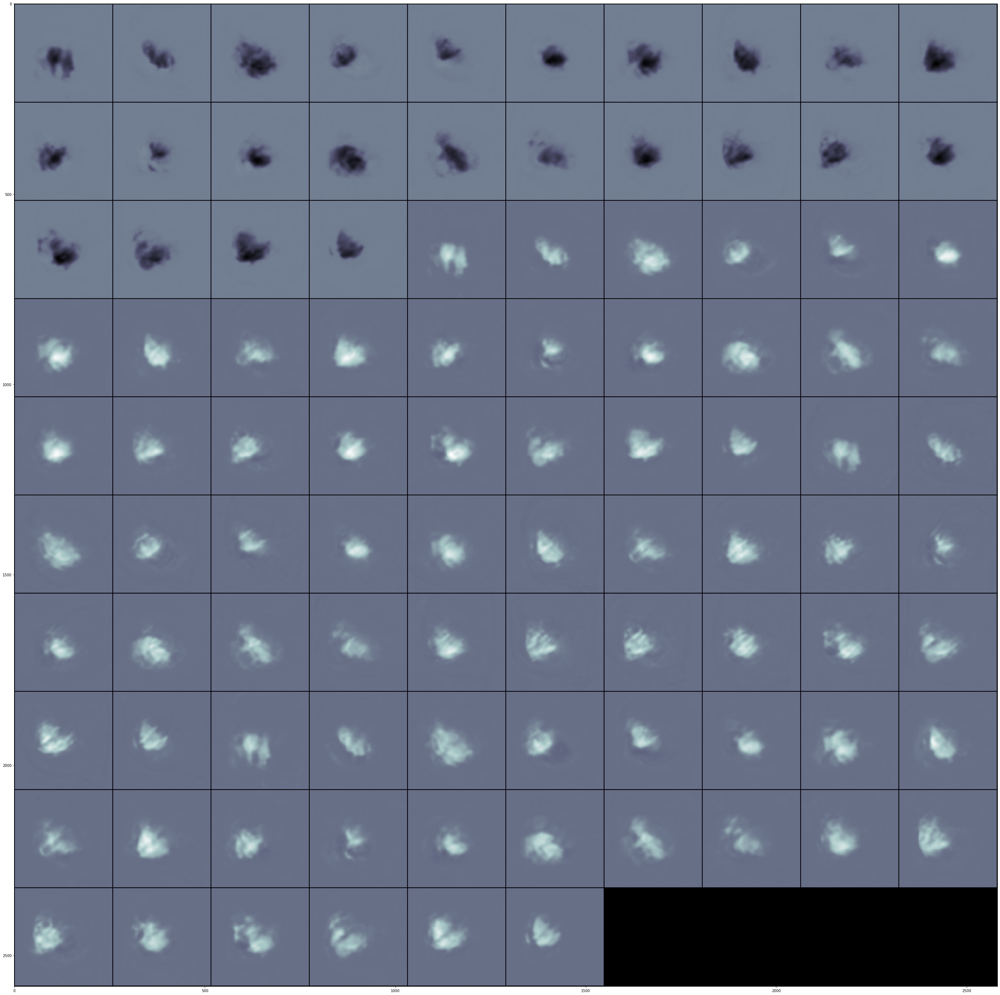

In [37]:
learn.show_results(ds_idx=1, nrows=5, figsize=(50,50))

## Second try (after several mini attempts)

In [17]:
learn = unet_learner_3d(dls, resnet34_3d, n_out=4, 
                        loss_func = dice_ce_loss,
                        metrics = [DiceMulti],
                        model_dir = './models',
                        cbs = [SaveModelCallback(monitor='dice_multi')]
                       )

learn.to_fp16()

In [18]:
learn.fine_tune(100,wd=0.1)

epoch,train_loss,valid_loss,dice_multi,time
0,2.125887,nan,0.092487,00:34


Better model found at epoch 0 with dice_multi value: 0.09248716492922719.


epoch,train_loss,valid_loss,dice_multi,time
0,1.868730,10.327630,0.223992,00:23
1,1.859761,2.040875,0.375289,00:23
2,1.851632,2.191370,0.370767,00:23
3,1.842817,2.261152,0.406783,00:23
4,1.836926,1.939065,0.412659,00:23
5,1.831739,1.867640,0.413592,00:23
6,1.829226,1.776973,0.426515,00:23
7,1.824795,1.769969,0.417591,00:23
8,1.820824,1.788898,0.418967,00:24
9,1.816856,1.764177,0.439732,00:23


Better model found at epoch 0 with dice_multi value: 0.22399193061506417.
Better model found at epoch 1 with dice_multi value: 0.37528940532997873.
Better model found at epoch 3 with dice_multi value: 0.40678306113187834.
Better model found at epoch 4 with dice_multi value: 0.4126594946914025.
Better model found at epoch 5 with dice_multi value: 0.4135921355445019.
Better model found at epoch 6 with dice_multi value: 0.42651475116808285.
Better model found at epoch 9 with dice_multi value: 0.4397318995759125.
Better model found at epoch 10 with dice_multi value: 0.447552498643912.
Better model found at epoch 12 with dice_multi value: 0.4519713415297359.
Better model found at epoch 13 with dice_multi value: 0.4600510774277158.
Better model found at epoch 19 with dice_multi value: 0.47563650264556806.
Better model found at epoch 20 with dice_multi value: 0.5064186584962559.
Better model found at epoch 29 with dice_multi value: 0.51973190186588.
Better model found at epoch 31 with dice_mu

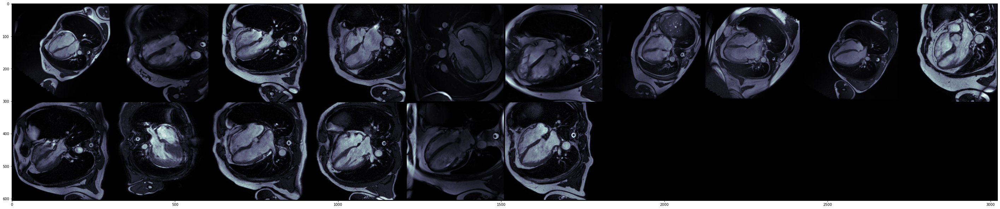

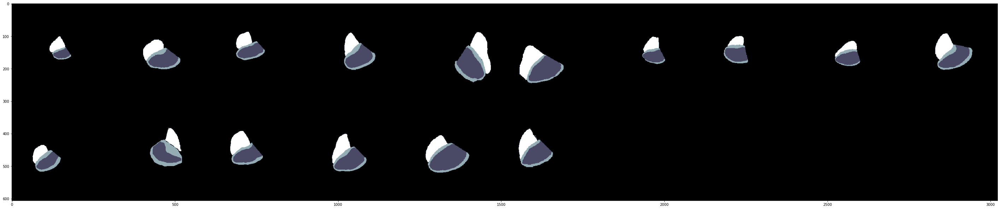

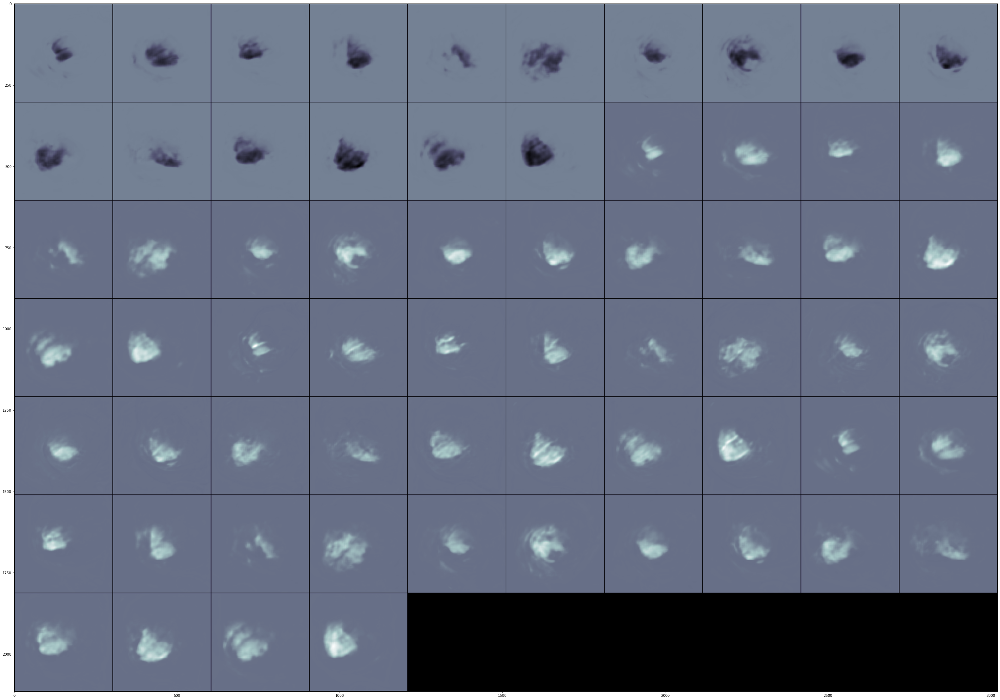

In [19]:
learn.show_results(ds_idx=1, nrows=5, figsize=(50,50))

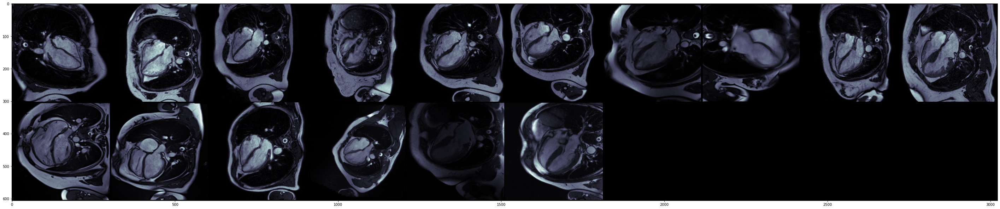

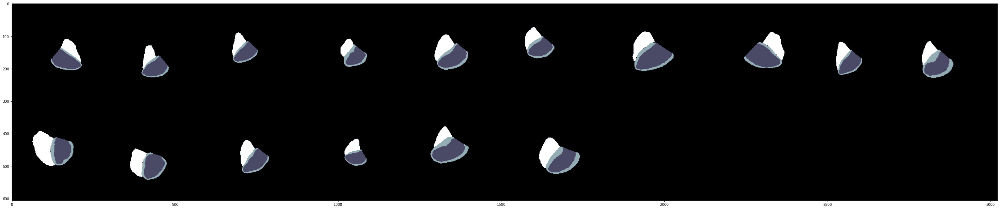

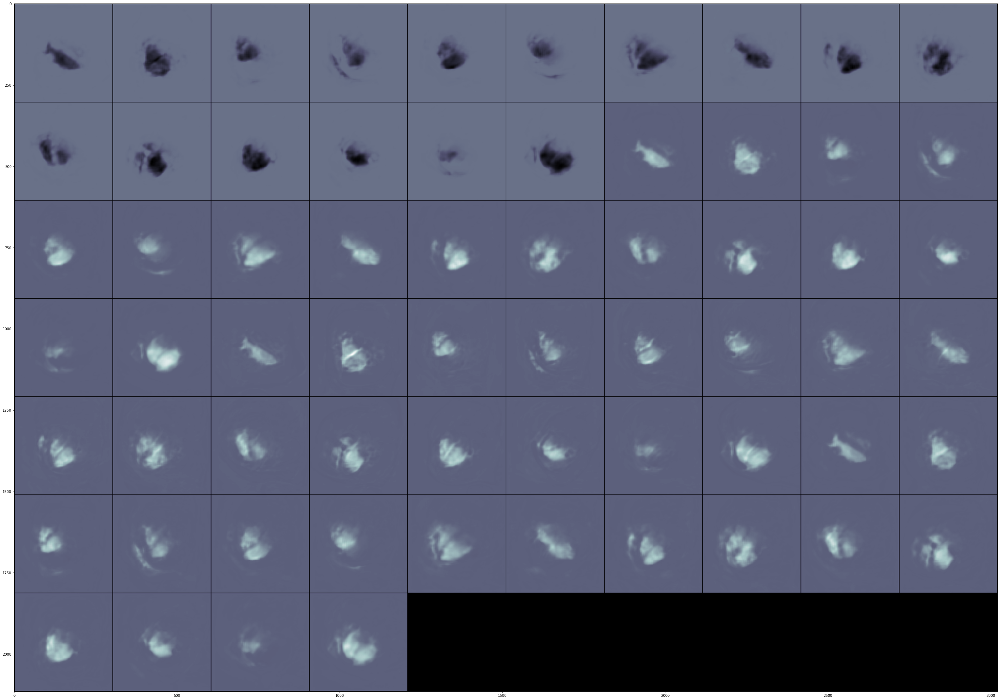

In [20]:
learn.show_results(ds_idx=0, nrows=5, figsize=(50,50))

+ **It looks like the model is doing a great job**

# Looking at the Ground Truth

In [31]:
dls = SegmentationDataLoaders3D.from_df(df2,path=path,
                                 valid_col = 'set',
                                 item_tfms = ResizeCrop3D((0, 0, 0), (1, 300, 300)),
                                batch_tfms = [RandomRotate3DBy(degrees=(0, 0, 45)),
                                     *aug_transforms_3d(p_all = .0,
                                                  warp = False, p_warp = None,
                                                  sheer = False, p_sheer = None,
                                                  trapezoid = False, p_trapezoid = None,
                                                  dihedral = False, p_dihedral = None,
                                                  brightness = False, p_brightness = None,
                                                  contrast = False, p_contrast = None,
                                                  noise = False, p_noise = None,
                                                  rotate_by = False, p_rotate_by = None,
                                                  flip = False, p_flip = None,
                                                  rotate = False, p_rotate = None,
                                                  blur = False, p_blur = None,
                                                  crop = False, p_crop = 1)
                                        ],
                                 bs = 16, val_bs = 16)

In [88]:
image=path/dls.train.items.iloc[0]['SA_ES']
mask=path/dls.train.items.iloc[0]['SA_ES_gt']

In [89]:
orig_nii = nib.load(image)
orig_nii.shape

(256, 208, 9)

In [35]:
mask_nii = nib.load(mask)
mask_nii.shape

(256, 208, 9)

In [36]:
np.round(orig_nii.affine)
np.round(mask_nii.affine)

array([[  -0.,    1.,    7.,    4.],
       [   0.,    1.,   -6., -133.],
       [  -1.,   -0.,   -3.,  168.],
       [   0.,    0.,    0.,    1.]])

+ Let's show some examples of the perspectives and their ground truths

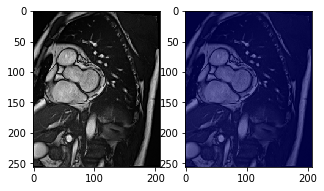

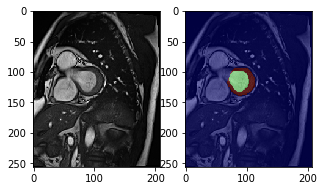

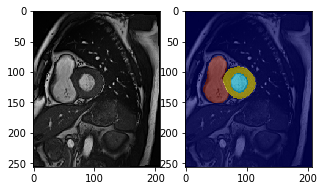

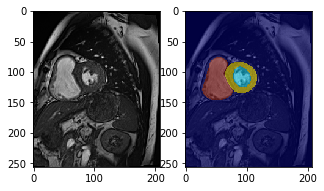

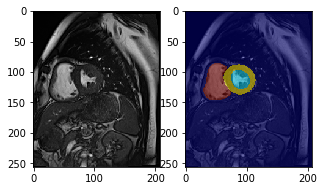

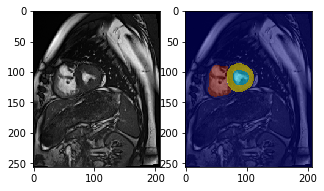

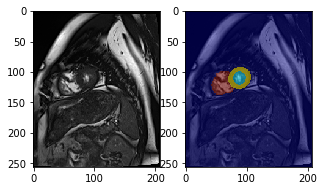

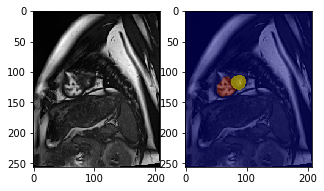

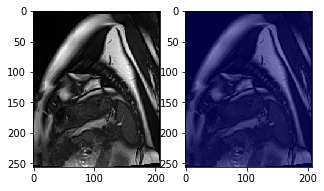

In [55]:
for i in range(0,9):
    plt.figure(figsize=(5,5))
    plt.subplot(1,2,1)
    plt.imshow(orig_nii.dataobj[:,:,i], 'gray', interpolation='none')
    plt.subplot(1,2,2)
    plt.imshow(orig_nii.dataobj[:,:,i], 'gray', interpolation='none')
    plt.imshow(mask_nii.dataobj[:,:,i], 'jet', interpolation='none', alpha=0.5)
    plt.show()